# Daily Weather Data Description

* The file daily_weather.csv is a comma separated file that contains weather data. This data comes from weather station. The weather station is equipped with sensors that captures weather related measurements such as air temperature, air pressure, and relative humidity. Data was collected for a period of 3 years, from September 2011 to September 2014, to ensure that sufficient data for different seasons and weather condition is captured

* Let us now check all the columns in the data

* Use 9 am Sensor Signals as Features to Predict Humidity at 3 pm.

## Data Gathering

In [287]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline

import sklearn 
from sklearn.model_selection import train_test_split
from sklearn import metrics

from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression
from pandas_profiling import ProfileReport

from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
import statsmodels.api as sm

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor

from sklearn.svm import SVC

from sklearn.neighbors import KNeighborsClassifier

from sklearn.naive_bayes import GaussianNB,MultinomialNB,BernoulliNB
import scipy.stats

In [288]:
df = pd.read_csv('data_weather.csv')
df

,number,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am,relative_humidity_3pm
0,0,918.060000,74.822000,271.100000,2.080354,295.400000,2.863283,0.0,0.0,42.420000,36.160000
1,1,917.347688,71.403843,101.935179,2.443009,140.471548,3.533324,0.0,0.0,24.328697,19.426597
2,2,923.040000,60.638000,51.000000,17.067852,63.700000,22.100967,0.0,20.0,8.900000,14.460000
3,3,920.502751,70.138895,198.832133,4.337363,211.203341,5.190045,0.0,0.0,12.189102,12.742547
4,4,921.160000,44.294000,277.800000,1.856660,136.500000,2.863283,8.9,14730.0,92.410000,76.740000
...,...,...,...,...,...,...,...,...,...,...,...
1090,1090,918.900000,63.104000,192.900000,3.869906,207.300000,5.212070,0.0,0.0,26.020000,38.180000
1091,1091,918.710000,49.568000,241.600000,1.811921,227.400000,2.371156,0.0,0.0,90.350000,73.340000
1092,1092,916.600000,71.096000,189.300000,3.064608,200.800000,3.892276,0.0,0.0,45.590000,52.310000
1093,1093,912.600000,58.406000,172.700000,3.825167,189.100000,4.764682,0.0,0.0,64.840000,58.280000


In [289]:
df.columns

Index(['number', 'air_pressure_9am', 'air_temp_9am', 'avg_wind_direction_9am',
       'avg_wind_speed_9am', 'max_wind_direction_9am', 'max_wind_speed_9am',
       'rain_accumulation_9am', 'rain_duration_9am', 'relative_humidity_9am',
       'relative_humidity_3pm'],
      dtype='object')

In [290]:
len(df.columns)

11

## Exploratory Data Analysis

In [291]:
df.drop('number', axis = 1, inplace=True)

In [292]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1095 entries, 0 to 1094
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   air_pressure_9am        1092 non-null   float64
 1   air_temp_9am            1090 non-null   float64
 2   avg_wind_direction_9am  1091 non-null   float64
 3   avg_wind_speed_9am      1092 non-null   float64
 4   max_wind_direction_9am  1092 non-null   float64
 5   max_wind_speed_9am      1091 non-null   float64
 6   rain_accumulation_9am   1089 non-null   float64
 7   rain_duration_9am       1092 non-null   float64
 8   relative_humidity_9am   1095 non-null   float64
 9   relative_humidity_3pm   1095 non-null   float64
dtypes: float64(10)
memory usage: 85.7 KB


In [293]:
df.isnull().any()

air_pressure_9am           True
air_temp_9am               True
avg_wind_direction_9am     True
avg_wind_speed_9am         True
max_wind_direction_9am     True
max_wind_speed_9am         True
rain_accumulation_9am      True
rain_duration_9am          True
relative_humidity_9am     False
relative_humidity_3pm     False
dtype: bool

In [294]:
df.isnull().sum()

air_pressure_9am          3
air_temp_9am              5
avg_wind_direction_9am    4
avg_wind_speed_9am        3
max_wind_direction_9am    3
max_wind_speed_9am        4
rain_accumulation_9am     6
rain_duration_9am         3
relative_humidity_9am     0
relative_humidity_3pm     0
dtype: int64

In [295]:
df[df['air_pressure_9am'].isnull()]

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am,relative_humidity_3pm
409,NaN,67.853833,65.880616,4.328594,78.570923,5.216734,0.000,0.0,18.487385,20.356594
546,NaN,42.746000,251.100000,12.929513,274.400000,17.604718,14.627,7825.0,87.870000,70.770000
869,NaN,45.104000,259.000000,3.265932,275.000000,4.026492,0.000,80.0,85.270000,90.260000


In [296]:
df[df['air_temp_9am'].isnull()]

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am,relative_humidity_3pm
16,917.890000,NaN,169.200000,2.192201,196.800000,2.930391,0.0,0.0,48.990000,51.190000
177,915.900000,NaN,183.300000,4.719943,189.900000,5.346287,0.0,0.0,29.260000,46.500000
840,918.043767,NaN,181.774042,0.964376,185.618601,1.570007,0.0,0.0,11.911222,18.154358
861,919.065408,NaN,172.303728,2.639600,193.058141,3.326949,0.0,0.0,12.497839,13.438518
1031,922.669195,NaN,47.946284,7.969686,65.770066,10.262337,0.0,0.0,18.920805,19.641841


In [297]:
df[df['avg_wind_direction_9am'].isnull()]

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am,relative_humidity_3pm
656,920.830000,66.344000,NaN,15.457255,189.400000,16.486248,0.0,0.0,23.770000,51.630000
672,922.448945,72.863773,NaN,3.682370,214.196160,4.849450,0.0,0.0,16.753670,17.804720
998,914.140000,71.240000,NaN,1.722444,232.900000,2.326418,0.0,0.0,24.200000,41.380000
1063,917.300185,65.790001,NaN,1.879553,222.498226,2.692862,0.0,0.0,14.972668,20.966267


In [298]:
df[df['avg_wind_speed_9am'].isnull()]

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am,relative_humidity_3pm
625,912.400000,50.774000,171.600000,NaN,181.400000,4.831790,0.00,0.000000,86.840000,64.740000
670,910.920000,48.362000,156.500000,NaN,177.500000,16.128337,4.97,10560.000000,80.560000,88.220000
731,922.970166,51.391847,33.810942,NaN,59.290089,11.111555,0.00,4.735034,34.807753,18.418179


In [299]:
df[df['max_wind_speed_9am'].isnull()]

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am,relative_humidity_3pm
111,915.29000,58.82000,182.60000,15.613841,189.000000,NaN,0.000,0.0,21.500000,29.690000
519,916.25000,55.67000,176.40000,6.666081,188.200000,NaN,0.000,0.0,72.550000,74.390000
737,917.89513,76.80469,104.77102,1.632705,97.178763,NaN,0.000,0.0,13.771311,16.792455
848,915.25000,37.56200,246.50000,11.587349,258.700000,NaN,3.171,2891.0,91.000000,90.780000


In [300]:
df[df['rain_accumulation_9am'].isnull()]

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am,relative_humidity_3pm
334,916.230000,75.740000,149.100000,2.751436,187.500000,4.183078,NaN,1480.000000,31.880000,32.900000
361,920.444946,65.801845,49.823346,21.520177,61.886944,25.549112,NaN,40.364018,12.278715,7.618649
381,918.480000,66.542000,90.900000,3.467257,89.400000,4.406772,NaN,0.000000,20.640000,14.350000
620,921.200000,56.786000,192.300000,9.551734,201.400000,11.005745,NaN,0.000000,59.790000,77.750000
705,911.900000,59.072000,199.800000,1.275056,239.500000,1.834291,NaN,0.000000,77.630000,59.130000
1066,919.564869,73.726732,68.704694,3.551777,102.571616,4.861315,NaN,0.000000,11.657314,17.331823


In [301]:
df.describe()

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am,relative_humidity_3pm
count,1092.000000,1090.000000,1091.000000,1092.000000,1092.000000,1091.000000,1089.000000,1092.000000,1095.000000,1095.000000
mean,918.882551,64.933001,142.235511,5.508284,148.953518,7.019514,0.203079,294.108052,34.241402,35.344727
std,3.184161,11.175514,69.137859,4.552813,67.238013,5.598209,1.593952,1598.078779,25.472067,22.524079
min,907.990000,36.752000,15.500000,0.693451,28.900000,1.185578,0.000000,0.000000,6.090000,5.300000
25%,916.550000,57.281000,65.972506,2.248768,76.553003,3.067477,0.000000,0.000000,15.092243,17.395000
50%,918.921045,65.715479,166.000000,3.871333,177.300000,4.943637,0.000000,0.000000,23.179259,24.380000
75%,921.160073,73.450974,191.000000,7.337163,201.233153,8.947760,0.000000,0.000000,45.400000,52.060000
max,929.320000,98.906000,343.400000,23.554978,312.200000,29.840780,24.020000,17704.000000,92.620000,92.250000


In [302]:
df.dropna(inplace=True)

In [303]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1064 entries, 0 to 1094
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   air_pressure_9am        1064 non-null   float64
 1   air_temp_9am            1064 non-null   float64
 2   avg_wind_direction_9am  1064 non-null   float64
 3   avg_wind_speed_9am      1064 non-null   float64
 4   max_wind_direction_9am  1064 non-null   float64
 5   max_wind_speed_9am      1064 non-null   float64
 6   rain_accumulation_9am   1064 non-null   float64
 7   rain_duration_9am       1064 non-null   float64
 8   relative_humidity_9am   1064 non-null   float64
 9   relative_humidity_3pm   1064 non-null   float64
dtypes: float64(10)
memory usage: 91.4 KB


In [20]:
ProfileReport(df)

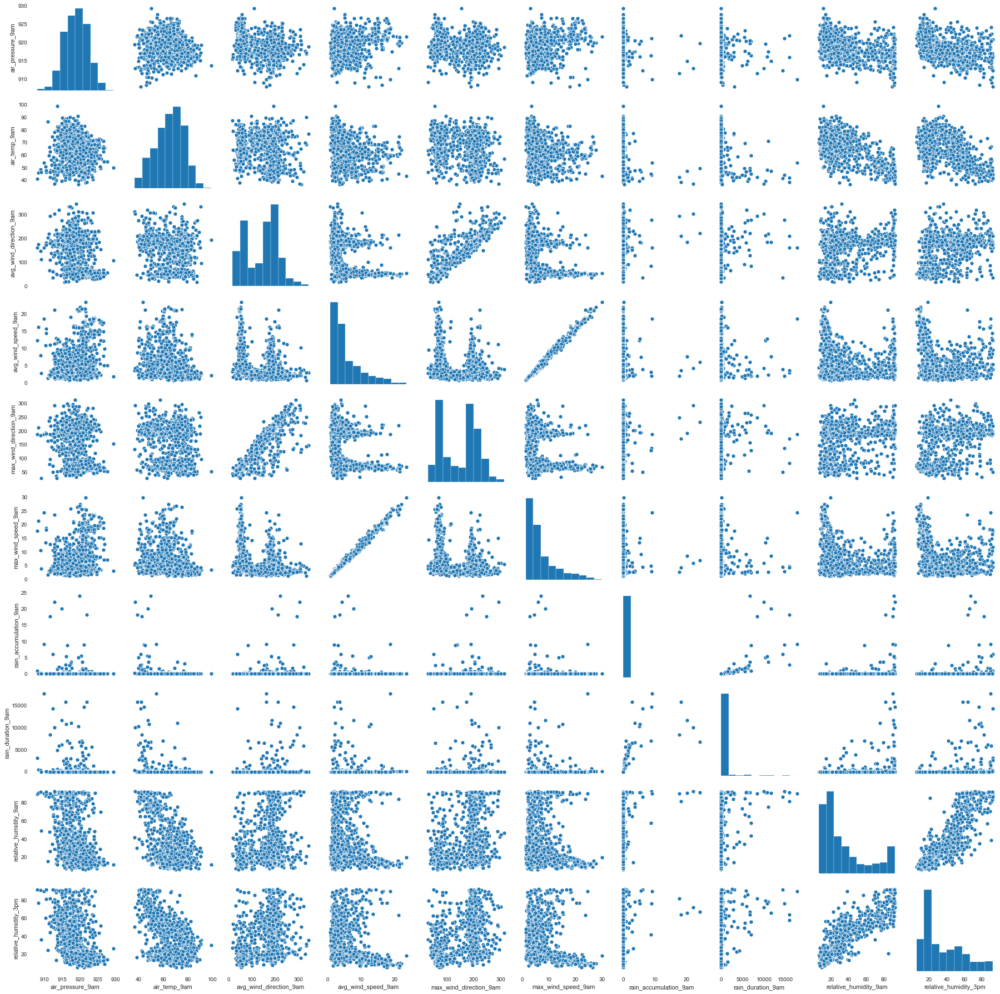

In [28]:
sns.pairplot(df)

In [259]:
df

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am,relative_humidity_3pm
0,918.060000,74.822000,271.100000,2.080354,295.400000,2.863283,0.0,0.0,42.420000,36.160000
1,917.347688,71.403843,101.935179,2.443009,140.471548,3.533324,0.0,0.0,24.328697,19.426597
2,923.040000,60.638000,51.000000,17.067852,63.700000,22.100967,0.0,20.0,8.900000,14.460000
3,920.502751,70.138895,198.832133,4.337363,211.203341,5.190045,0.0,0.0,12.189102,12.742547
4,921.160000,44.294000,277.800000,1.856660,136.500000,2.863283,8.9,14730.0,92.410000,76.740000
...,...,...,...,...,...,...,...,...,...,...
1090,918.900000,63.104000,192.900000,3.869906,207.300000,5.212070,0.0,0.0,26.020000,38.180000
1091,918.710000,49.568000,241.600000,1.811921,227.400000,2.371156,0.0,0.0,90.350000,73.340000
1092,916.600000,71.096000,189.300000,3.064608,200.800000,3.892276,0.0,0.0,45.590000,52.310000
1093,912.600000,58.406000,172.700000,3.825167,189.100000,4.764682,0.0,0.0,64.840000,58.280000


In [260]:
df.isnull().sum()

air_pressure_9am          0
air_temp_9am              0
avg_wind_direction_9am    0
avg_wind_speed_9am        0
max_wind_direction_9am    0
max_wind_speed_9am        0
rain_accumulation_9am     0
rain_duration_9am         0
relative_humidity_9am     0
relative_humidity_3pm     0
dtype: int64

In [261]:
rel_hum = df['relative_humidity_3pm']

In [262]:
rel_hum.isnull().sum()

0

In [263]:
# Scaling down the data using Standard Scaler
scaler = StandardScaler()

In [264]:
x = scaler.fit_transform(df.iloc[:,:-1])

In [265]:
df = pd.DataFrame(x,columns = ['air_pressure_9am', 'air_temp_9am', 'avg_wind_direction_9am','avg_wind_speed_9am', 'max_wind_direction_9am', 'max_wind_speed_9am', 'rain_accumulation_9am', 'rain_duration_9am', 'relative_humidity_9am'])

In [266]:
df

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am
0,-0.265356,0.877863,1.863410,-0.751372,2.188800,-0.740213,-0.118677,-0.177314,0.329163
1,-0.489526,0.571652,-0.584105,-0.671356,-0.119316,-0.620310,-0.118677,-0.177314,-0.384645
2,1.301892,-0.392788,-1.321047,2.555451,-1.263054,2.702365,-0.118677,-0.164002,-0.993399
3,0.503398,0.458334,0.817822,-0.253388,0.934443,-0.323840,-0.118677,-0.177314,-0.863624
4,0.710240,-1.856939,1.960347,-0.800727,-0.178484,-0.740213,5.684011,9.627093,2.301564
...,...,...,...,...,...,...,...,...,...
1059,-0.001001,-0.171876,0.731995,-0.356527,0.876291,-0.319898,-0.118677,-0.177314,-0.317914
1060,-0.060795,-1.384476,1.436597,-0.810598,1.175740,-0.828279,-0.118677,-0.177314,2.220285
1061,-0.724830,0.544075,0.679909,-0.534207,0.779454,-0.556075,-0.118677,-0.177314,0.454238
1062,-1.983663,-0.592738,0.439736,-0.366398,0.605148,-0.399958,-0.118677,-0.177314,1.213765


In [267]:
df.isnull().sum()

air_pressure_9am          0
air_temp_9am              0
avg_wind_direction_9am    0
avg_wind_speed_9am        0
max_wind_direction_9am    0
max_wind_speed_9am        0
rain_accumulation_9am     0
rain_duration_9am         0
relative_humidity_9am     0
dtype: int64

In [268]:
rel_hum.isnull().sum()

0

In [269]:
df = pd.concat([df, rel_hum], axis = 1)

In [270]:
df

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am,relative_humidity_3pm
0,-0.265356,0.877863,1.863410,-0.751372,2.188800,-0.740213,-0.118677,-0.177314,0.329163,36.160000
1,-0.489526,0.571652,-0.584105,-0.671356,-0.119316,-0.620310,-0.118677,-0.177314,-0.384645,19.426597
2,1.301892,-0.392788,-1.321047,2.555451,-1.263054,2.702365,-0.118677,-0.164002,-0.993399,14.460000
3,0.503398,0.458334,0.817822,-0.253388,0.934443,-0.323840,-0.118677,-0.177314,-0.863624,12.742547
4,0.710240,-1.856939,1.960347,-0.800727,-0.178484,-0.740213,5.684011,9.627093,2.301564,76.740000
...,...,...,...,...,...,...,...,...,...,...
1090,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.180000
1091,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.340000
1092,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.310000
1093,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58.280000


In [304]:
l = []
for i in df['relative_humidity_3pm']:
    if i > 25:
        l.append(1)
    else:
        l.append(0)
df['relative_humidity_3pm'] = l

In [305]:
df

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am,relative_humidity_3pm
0,918.060000,74.822000,271.100000,2.080354,295.400000,2.863283,0.0,0.0,42.420000,1
1,917.347688,71.403843,101.935179,2.443009,140.471548,3.533324,0.0,0.0,24.328697,0
2,923.040000,60.638000,51.000000,17.067852,63.700000,22.100967,0.0,20.0,8.900000,0
3,920.502751,70.138895,198.832133,4.337363,211.203341,5.190045,0.0,0.0,12.189102,0
4,921.160000,44.294000,277.800000,1.856660,136.500000,2.863283,8.9,14730.0,92.410000,1
...,...,...,...,...,...,...,...,...,...,...
1090,918.900000,63.104000,192.900000,3.869906,207.300000,5.212070,0.0,0.0,26.020000,1
1091,918.710000,49.568000,241.600000,1.811921,227.400000,2.371156,0.0,0.0,90.350000,1
1092,916.600000,71.096000,189.300000,3.064608,200.800000,3.892276,0.0,0.0,45.590000,1
1093,912.600000,58.406000,172.700000,3.825167,189.100000,4.764682,0.0,0.0,64.840000,1


In [273]:
df.dropna(inplace = True)

In [306]:
df.shape

(1064, 10)

In [307]:
df.isnull().sum()

air_pressure_9am          0
air_temp_9am              0
avg_wind_direction_9am    0
avg_wind_speed_9am        0
max_wind_direction_9am    0
max_wind_speed_9am        0
rain_accumulation_9am     0
rain_duration_9am         0
relative_humidity_9am     0
relative_humidity_3pm     0
dtype: int64

## Logistic Regression

In [308]:
l = LogisticRegression()

In [309]:
x = df.iloc[:,:-1]
y = df.iloc[:,-1]

In [310]:
x.head()

,air_pressure_9am,air_temp_9am,avg_wind_direction_9am,avg_wind_speed_9am,max_wind_direction_9am,max_wind_speed_9am,rain_accumulation_9am,rain_duration_9am,relative_humidity_9am
0,918.060000,74.822000,271.100000,2.080354,295.400000,2.863283,0.0,0.0,42.420000
1,917.347688,71.403843,101.935179,2.443009,140.471548,3.533324,0.0,0.0,24.328697
2,923.040000,60.638000,51.000000,17.067852,63.700000,22.100967,0.0,20.0,8.900000
3,920.502751,70.138895,198.832133,4.337363,211.203341,5.190045,0.0,0.0,12.189102
4,921.160000,44.294000,277.800000,1.856660,136.500000,2.863283,8.9,14730.0,92.410000


In [311]:
y.head()

0    1
1    0
2    0
3    0
4    1
Name: relative_humidity_3pm, dtype: int64

In [312]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, shuffle = True )

In [313]:
l.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [314]:
l.coef_ # b

array([[-6.65595212e-03,  2.30930588e-02, -3.31295981e-04,
         1.23625176e+00,  4.19963392e-03, -1.09437355e+00,
         9.48922748e-01, -4.35806842e-04,  1.77789085e-01]])

In [315]:
l.intercept_ # a

array([0.05857664])

#### Training Accuracy

In [316]:
metrics.accuracy_score(y_train, l.predict(X_train))

0.8776881720430108

#### Training Accuracy

In [317]:
metrics.accuracy_score(y_test, l.predict(X_test))

0.896875

Text(0.5, 12.5, 'Predicted')

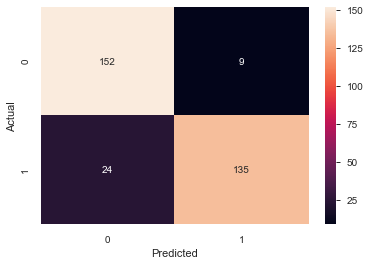

In [318]:
cm = metrics.confusion_matrix(y_test, l.predict(X_test))
sns.heatmap(cm, annot = True, fmt = '.4g')
plt.ylabel('Actual')
plt.xlabel('Predicted')

## Random Forest

In [342]:
model = RandomForestClassifier(n_estimators=1000, criterion='gini')

In [343]:
model.max_features = 3

In [344]:
model = model.fit(X_train, y_train)

In [345]:
y_test_pred = model.predict(X_test)

In [346]:
metrics.accuracy_score(y_test, y_test_pred)

0.93125

Text(0.5, 12.5, 'Predicted')

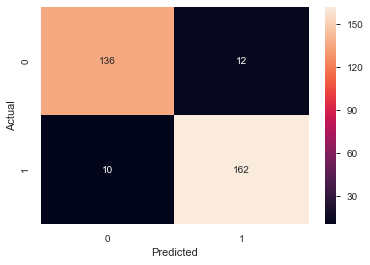

In [347]:
cm = metrics.confusion_matrix(y_test, model.predict(X_test))
sns.heatmap(cm, annot = True, fmt = '.4g')
plt.ylabel('Actual')
plt.xlabel('Predicted')

#### Accuracy over 10 observations

In [324]:
l1=[]
for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(x, y,test_size=0.3, shuffle=True) 

    model=RandomForestClassifier( 1000)
    model=model.fit(X_train,y_train)
    y_test_pred=model.predict(X_test)
    l1.append(metrics.accuracy_score(y_test,y_test_pred))
    print(metrics.accuracy_score(y_test,y_test_pred))

0.909375
0.925
0.903125
0.91875
0.890625
0.9125
0.915625
0.909375
0.90625
0.93125


## Bagging

In [348]:
from sklearn.ensemble import bagging

In [349]:
model = bagging.BaggingClassifier(n_estimators=200, max_samples=0.9)

In [350]:
model.fit(X_train, y_train)

BaggingClassifier(base_estimator=None, bootstrap=True, bootstrap_features=False,
                  max_features=1.0, max_samples=0.9, n_estimators=200,
                  n_jobs=None, oob_score=False, random_state=None, verbose=0,
                  warm_start=False)

In [351]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

In [352]:
print('training accuracy = ',metrics.accuracy_score(y_train, y_train_pred))
print('testing accuracy = ',metrics.accuracy_score(y_test, y_test_pred))

training accuracy =  1.0
testing accuracy =  0.925


Text(0.5, 12.5, 'Predicted')

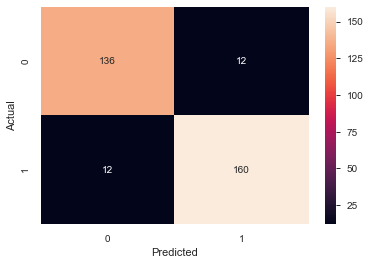

In [353]:
cm = metrics.confusion_matrix(y_test, model.predict(X_test))
sns.heatmap(cm, annot = True, fmt = '.4g')
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [354]:
l2=[]
for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(x, y,test_size=0.3, shuffle=True) 

    model=bagging.BaggingClassifier(n_estimators=200, max_samples=0.9)
    model=model.fit(X_train,y_train)
    y_test_pred=model.predict(X_test)
    l2.append(metrics.accuracy_score(y_test,y_test_pred))
    print(metrics.accuracy_score(y_test,y_test_pred))

0.9
0.9125
0.909375
0.903125
0.884375
0.91875
0.925
0.878125
0.890625
0.88125


## AdaBoost

In [355]:
from sklearn.ensemble import AdaBoostClassifier

In [356]:
model = AdaBoostClassifier(n_estimators=50,learning_rate=0.05)
model.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=0.05,
                   n_estimators=50, random_state=None)

In [357]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

In [358]:
print('training accuracy = ',metrics.accuracy_score(y_train, y_train_pred))
print('testing accuracy = ',metrics.accuracy_score(y_test, y_test_pred))

training accuracy =  0.8817204301075269
testing accuracy =  0.85


Text(0.5, 12.5, 'Predicted')

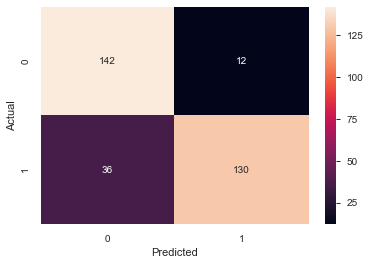

In [359]:
cm = metrics.confusion_matrix(y_test, model.predict(X_test))
sns.heatmap(cm, annot = True, fmt = '.4g')
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [360]:
l3=[]
for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(x, y,test_size=0.3, shuffle=True) 

    model=AdaBoostClassifier(n_estimators=50,learning_rate=0.05)
    model=model.fit(X_train,y_train)
    y_test_pred=model.predict(X_test)
    l3.append(metrics.accuracy_score(y_test,y_test_pred))
    print(metrics.accuracy_score(y_test,y_test_pred))

0.896875
0.878125
0.875
0.89375
0.840625
0.890625
0.890625
0.878125
0.8625
0.865625


## Support Vector Machines

In [361]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.33, shuffle = True)

In [362]:
model = SVC(kernel='linear')

In [363]:
model.fit(X_train, y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='linear', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [364]:
metrics.accuracy_score(y_test, model.predict(X_test))

0.8579545454545454

In [365]:
vec = model.support_vectors_
vec

array([[9.20480998e+02, 6.55192357e+01, 1.11747921e+02, ...,
        0.00000000e+00, 0.00000000e+00, 2.28960397e+01],
       [9.22883180e+02, 6.97777171e+01, 1.94016586e+02, ...,
        0.00000000e+00, 0.00000000e+00, 1.92816672e+01],
       [9.15374595e+02, 7.29948172e+01, 2.14893054e+02, ...,
        6.53460429e-03, 4.90095322e+01, 2.70308115e+01],
       ...,
       [9.18260000e+02, 8.24000000e+01, 2.11600000e+02, ...,
        0.00000000e+00, 0.00000000e+00, 1.07600000e+01],
       [9.29320000e+02, 4.99820000e+01, 1.07700000e+02, ...,
        0.00000000e+00, 0.00000000e+00, 1.13400000e+01],
       [9.20000000e+02, 7.48940000e+01, 4.67000000e+01, ...,
        0.00000000e+00, 0.00000000e+00, 2.73600000e+01]])

Text(0.5, 12.5, 'Predicted')

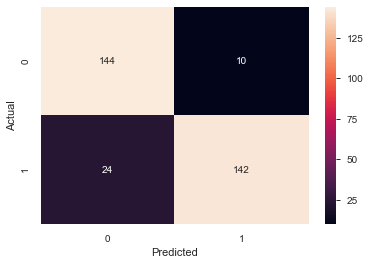

In [368]:
cm = metrics.confusion_matrix(y_test, model.predict(X_test))
sns.heatmap(cm, annot = True, fmt = '.4g')
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [367]:
l4=[]
for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(x, y,test_size=0.3, shuffle=True) 

    model=SVC(kernel='linear')
    model=model.fit(X_train,y_train)
    y_test_pred=model.predict(X_test)
    l4.append(metrics.accuracy_score(y_test,y_test_pred))
    print(metrics.accuracy_score(y_test,y_test_pred))

0.878125
0.86875
0.875
0.896875
0.8625
0.86875
0.890625
0.871875
0.9
0.89375


## K Nearest Neighbors

In [369]:
model = KNeighborsClassifier(n_neighbors = 4)

In [370]:
model = model.fit(X_train, y_train)

In [371]:
y_test_pred = model.predict(X_test)

In [372]:
metrics.accuracy_score(y_test, y_test_pred)

0.86875

Text(0.5, 12.5, 'Predicted')

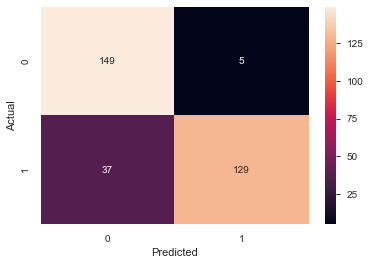

In [373]:
cm = metrics.confusion_matrix(y_test, model.predict(X_test))
sns.heatmap(cm, annot = True, fmt = '.4g')
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [374]:
l5=[]
for i in range(10):
    model=KNeighborsClassifier(n_neighbors = 4)
    model=model.fit(X_train,y_train)
    y_test_pred=model.predict(X_test)
    l5.append(metrics.accuracy_score(y_test,y_test_pred))
    print(metrics.accuracy_score(y_test,y_test_pred))

0.86875
0.86875
0.86875
0.86875
0.86875
0.86875
0.86875
0.86875
0.86875
0.86875


## Naive Bayes

In [375]:
model = GaussianNB()
model = model.fit(X_train, y_train)

In [376]:
y_test_pred = model.predict(X_test)

In [377]:
metrics.accuracy_score(y_test_pred,y_test)

0.759375

In [378]:
l6=[]
for i in range(10):
    model=GaussianNB()
    model=model.fit(X_train,y_train)
    y_test_pred=model.predict(X_test)
    l6.append(metrics.accuracy_score(y_test,y_test_pred))
    print(metrics.accuracy_score(y_test,y_test_pred))

0.759375
0.759375
0.759375
0.759375
0.759375
0.759375
0.759375
0.759375
0.759375
0.759375


In [380]:
K = pd.DataFrame(columns = ['f1', 'class'])
K["f1"]=l1+l2+l3+l4
K["class"]=["RF"]*10+["BG"]*10+["ADA"]*10+["SVC"]*10

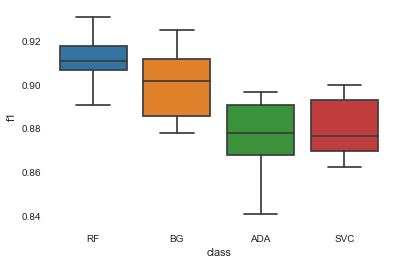

In [381]:
sns.boxplot(K["class"],K.f1)